In [1]:
import pandas as pd
import numpy as np
import missingno as msno
import matplotlib.pyplot as plt
import plotly.express as px
from statsmodels.tsa.arima.model import ARIMA
from wordcloud import WordCloud
import re
import nltk
nltk.download('vader_lexicon')
import seaborn as sns
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
import datetime
import string


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/alyona_dushkina/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [2]:
# Загрузка набора данных
df = pd.read_csv('vaccination_all_tweets.csv')
df_1 = df.copy()

In [3]:
df.head()

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet
0,1340539111971516416,Rachel Roh,"La Crescenta-Montrose, CA",Aggregator of Asian American news; scanning di...,2009-04-08 17:52:46,405,1692,3247,False,2020-12-20 06:06:44,Same folks said daikon paste could treat a cyt...,['PfizerBioNTech'],Twitter for Android,0,0,False
1,1338158543359250433,Albert Fong,"San Francisco, CA","Marketing dude, tech geek, heavy metal & '80s ...",2009-09-21 15:27:30,834,666,178,False,2020-12-13 16:27:13,While the world has been on the wrong side of ...,NaN,Twitter Web App,1,1,False
2,1337858199140118533,eli🇱🇹🇪🇺👌,Your Bed,"heil, hydra 🖐☺",2020-06-25 23:30:28,10,88,155,False,2020-12-12 20:33:45,#coronavirus #SputnikV #AstraZeneca #PfizerBio...,"['coronavirus', 'SputnikV', 'AstraZeneca', 'Pf...",Twitter for Android,0,0,False
3,1337855739918835717,Charles Adler,"Vancouver, BC - Canada","Hosting ""CharlesAdlerTonight"" Global News Radi...",2008-09-10 11:28:53,49165,3933,21853,True,2020-12-12 20:23:59,"Facts are immutable, Senator, even when you're...",NaN,Twitter Web App,446,2129,False
4,1337854064604966912,Citizen News Channel,NaN,Citizen News Channel bringing you an alternati...,2020-04-23 17:58:42,152,580,1473,False,2020-12-12 20:17:19,Explain to me again why we need a vaccine @Bor...,"['whereareallthesickpeople', 'PfizerBioNTech']",Twitter for iPhone,0,0,False


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 228207 entries, 0 to 228206
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   id                228207 non-null  int64 
 1   user_name         228205 non-null  object
 2   user_location     161296 non-null  object
 3   user_description  211184 non-null  object
 4   user_created      228207 non-null  object
 5   user_followers    228207 non-null  int64 
 6   user_friends      228207 non-null  int64 
 7   user_favourites   228207 non-null  int64 
 8   user_verified     228207 non-null  bool  
 9   date              228207 non-null  object
 10  text              228207 non-null  object
 11  hashtags          178504 non-null  object
 12  source            228088 non-null  object
 13  retweets          228207 non-null  int64 
 14  favorites         228207 non-null  int64 
 15  is_retweet        228207 non-null  bool  
dtypes: bool(2), int64(6), object(8)
memory

In [5]:
# Преобразование столбца с датой в формат datetime
df['date'] = pd.to_datetime(df['date']).dt.date 



In [6]:
df.head()

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet
0,1340539111971516416,Rachel Roh,"La Crescenta-Montrose, CA",Aggregator of Asian American news; scanning di...,2009-04-08 17:52:46,405,1692,3247,False,2020-12-20,Same folks said daikon paste could treat a cyt...,['PfizerBioNTech'],Twitter for Android,0,0,False
1,1338158543359250433,Albert Fong,"San Francisco, CA","Marketing dude, tech geek, heavy metal & '80s ...",2009-09-21 15:27:30,834,666,178,False,2020-12-13,While the world has been on the wrong side of ...,NaN,Twitter Web App,1,1,False
2,1337858199140118533,eli🇱🇹🇪🇺👌,Your Bed,"heil, hydra 🖐☺",2020-06-25 23:30:28,10,88,155,False,2020-12-12,#coronavirus #SputnikV #AstraZeneca #PfizerBio...,"['coronavirus', 'SputnikV', 'AstraZeneca', 'Pf...",Twitter for Android,0,0,False
3,1337855739918835717,Charles Adler,"Vancouver, BC - Canada","Hosting ""CharlesAdlerTonight"" Global News Radi...",2008-09-10 11:28:53,49165,3933,21853,True,2020-12-12,"Facts are immutable, Senator, even when you're...",NaN,Twitter Web App,446,2129,False
4,1337854064604966912,Citizen News Channel,NaN,Citizen News Channel bringing you an alternati...,2020-04-23 17:58:42,152,580,1473,False,2020-12-12,Explain to me again why we need a vaccine @Bor...,"['whereareallthesickpeople', 'PfizerBioNTech']",Twitter for iPhone,0,0,False


In [7]:
# Rows containing duplicate data 
duplicate_rows_df = df[df.duplicated()]
print("number of duplicate rows:", duplicate_rows_df.shape)

number of duplicate rows: (0, 16)


<Axes: >

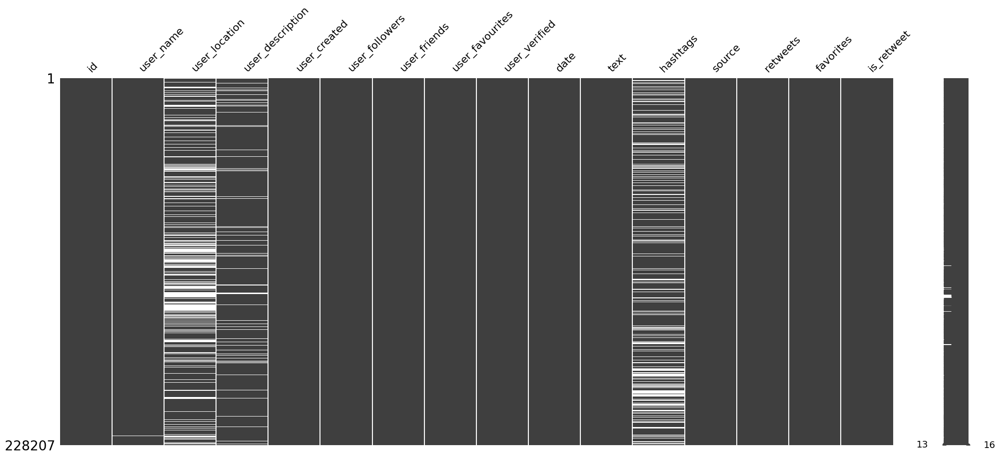

In [8]:
msno.matrix(df) 

In [9]:
df.isna().sum()
# Мы видим, что в user_location, description, sources много недостающих данных.

id                      0
user_name               2
user_location       66911
user_description    17023
user_created            0
user_followers          0
user_friends            0
user_favourites         0
user_verified           0
date                    0
text                    0
hashtags            49703
source                119
retweets                0
favorites               0
is_retweet              0
dtype: int64

In [10]:
df=df.drop_duplicates('text')             #dropping duplicate tweets
df.shape

(226373, 16)

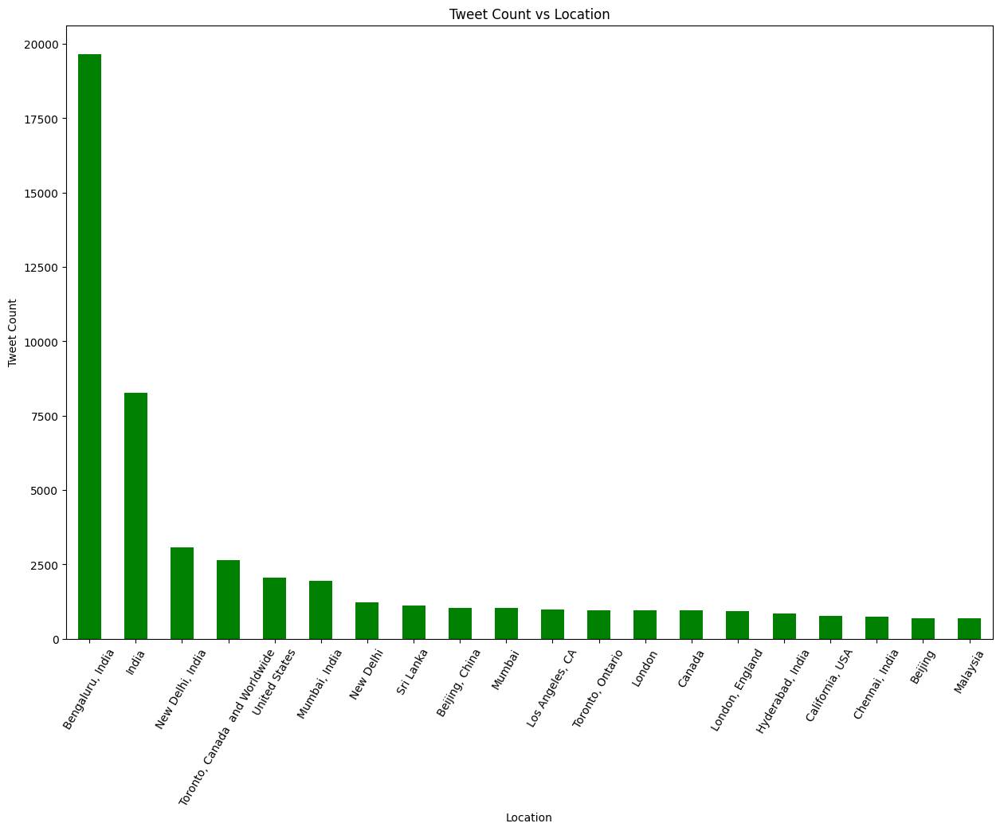

In [11]:
# Визуализация Tweet Count vs Location
plt.figure(figsize=(15,10))
df['user_location'].value_counts().nlargest(20).plot(kind='bar', color='green')

# Настройка осей и меток
plt.xticks(rotation=60)
plt.xlabel('Location')
plt.ylabel('Tweet Count')
plt.title('Tweet Count vs Location')

# Отображение графика
plt.show()

<Axes: >

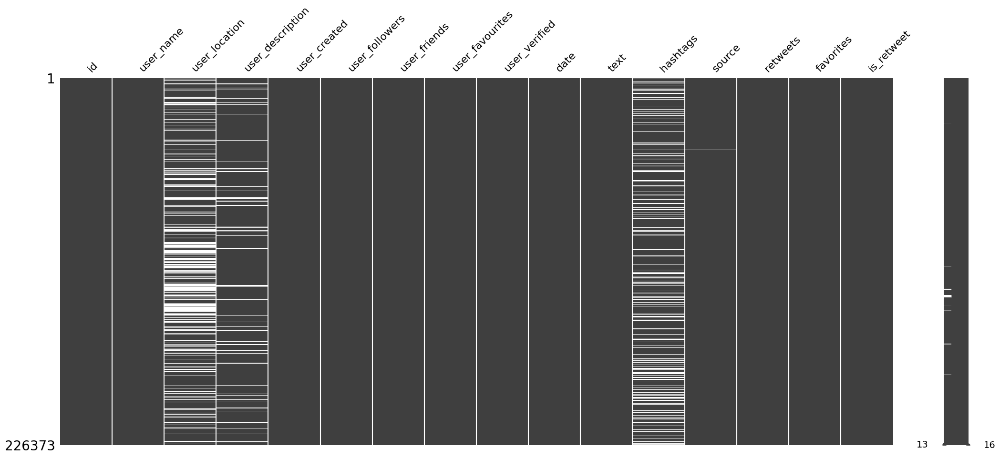

In [12]:
msno.matrix(df) 

In [13]:
df.source.value_counts()


source
Twitter for Android            58553
Twitter Web App                57050
Twitter for iPhone             49396
CowinAlertsBot                 11276
cowin_vaccine_app              10203
                               ...  
newsR                              1
todayinnevada                      1
Collected Times Top Stories        1
Breaking Market News               1
TrialStat-WP2Twtr                  1
Name: count, Length: 379, dtype: int64

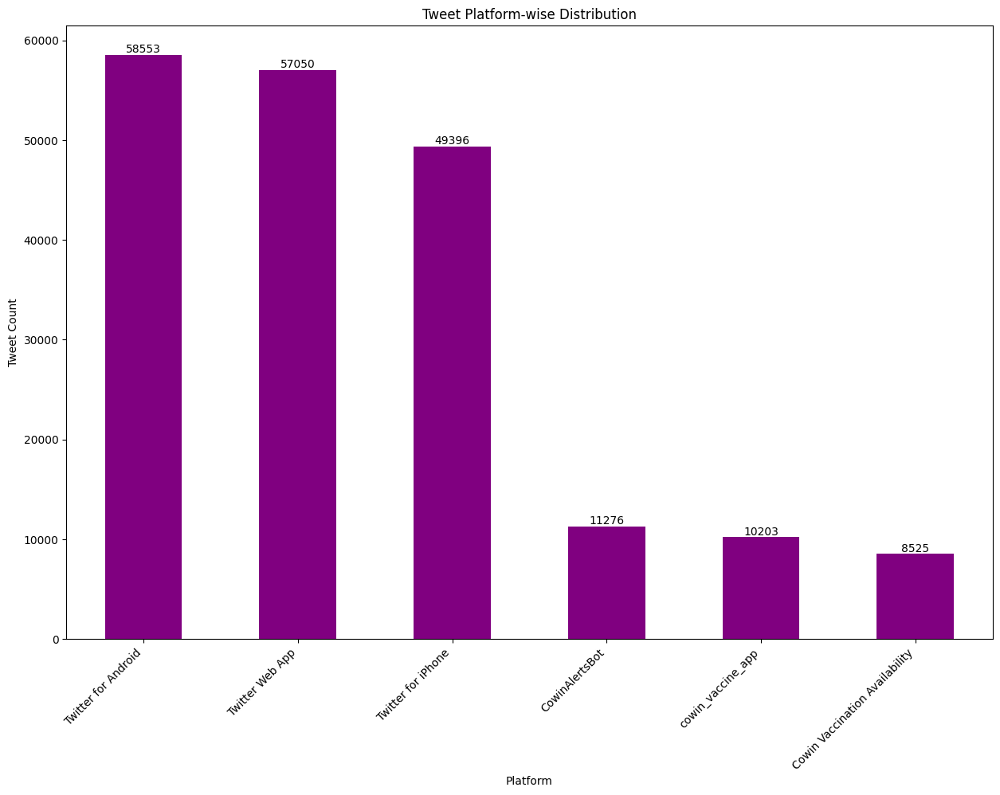

In [14]:
# Визуализация Tweet Platform-wise Distribution
plt.figure(figsize=(15,10))
platform_counts = df['source'].value_counts().nlargest(6)
platform_counts.plot(kind='bar', color='purple')

# Настройка осей и меток
plt.xlabel('Platform')
plt.ylabel('Tweet Count')
plt.title('Tweet Platform-wise Distribution')

# Установка меток на оси x
plt.xticks(rotation=45, ha='right', fontsize=10)

# Добавление значения над каждым столбиком
for i, count in enumerate(platform_counts):
    plt.text(i, count, str(count), ha='center', va='bottom')

# Отображение графика
plt.show()

In [15]:
len(df['date'].unique())  #Number of days considered


319

In [16]:
df.sort_values(by=['date'], ascending=[True]).head(2)


,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet
294,1337884374927368201,Nacindex,NaN,Tweet and RT all things #OpenFinance #bitcoin ...,2019-03-16 15:14:32,331,431,1132,False,2020-12-12,https://t.co/Z3j0NbDUbq\nUS agency authorizes ...,NaN,Twitter Web App,1,0,False
34,1337742528108519424,Rajat Kotra,"London, England","Ever-curious polymath,#global leader#startups#...",2009-12-03 12:03:28,754,917,220,False,2020-12-12,Vaccine!! Anyone?? #covid #Pfizervaccine #Pfiz...,"['covid', 'Pfizervaccine', 'PfizerBioNTech']",Twitter for Android,0,0,False


It's visible that the dataset has covid vaccine related tweets from 12th December ,2020



In [17]:
df.drop(columns={"id","user_name","user_description","user_created","user_followers",\
                   "user_friends","user_favourites","user_verified","hashtags","source","retweets","favorites","is_retweet"},inplace=True)
# dropping unnecessary 

In [18]:
df.head()

,user_location,date,text
0,"La Crescenta-Montrose, CA",2020-12-20,Same folks said daikon paste could treat a cyt...
1,"San Francisco, CA",2020-12-13,While the world has been on the wrong side of ...
2,Your Bed,2020-12-12,#coronavirus #SputnikV #AstraZeneca #PfizerBio...
3,"Vancouver, BC - Canada",2020-12-12,"Facts are immutable, Senator, even when you're..."
4,NaN,2020-12-12,Explain to me again why we need a vaccine @Bor...


In [19]:
# Text transformation to lowercase
df['text'] =df['text'].str.lower()
df['text']

0         same folks said daikon paste could treat a cyt...
1         while the world has been on the wrong side of ...
2         #coronavirus #sputnikv #astrazeneca #pfizerbio...
3         facts are immutable, senator, even when you're...
4         explain to me again why we need a vaccine @bor...
                                ...                        
228202    45+ #urban #bengaluru #covidvaccine availabili...
228203    18-44 #bbmp #bengaluru #covidvaccine availabil...
228204    18-44 #urban #bengaluru #covidvaccine availabi...
228205    they promote their vaccines leaving out the st...
228206    45+ #urban #bengaluru #covidvaccine availabili...
Name: text, Length: 226373, dtype: object

In [20]:
# URL removal from text
df['text'] = df['text'].apply(lambda x:re.sub(r"http\S+", "", x))
df["text"]

0         same folks said daikon paste could treat a cyt...
1         while the world has been on the wrong side of ...
2         #coronavirus #sputnikv #astrazeneca #pfizerbio...
3         facts are immutable, senator, even when you're...
4         explain to me again why we need a vaccine @bor...
                                ...                        
228202    45+ #urban #bengaluru #covidvaccine availabili...
228203    18-44 #bbmp #bengaluru #covidvaccine availabil...
228204    18-44 #urban #bengaluru #covidvaccine availabi...
228205    they promote their vaccines leaving out the st...
228206    45+ #urban #bengaluru #covidvaccine availabili...
Name: text, Length: 226373, dtype: object

In [21]:
import string

In [22]:
# Punctuation from text
punctuation_removal = string.punctuation
def remove_punctuation(text):
    """custom function to remove the punctuation"""
    return text.translate(str.maketrans('', '', punctuation_removal))
df["text"] = df["text"].apply(lambda text: remove_punctuation(text))
df["text"]

0         same folks said daikon paste could treat a cyt...
1         while the world has been on the wrong side of ...
2         coronavirus sputnikv astrazeneca pfizerbiontec...
3         facts are immutable senator even when youre no...
4         explain to me again why we need a vaccine bori...
                                ...                        
228202    45 urban bengaluru covidvaccine availability f...
228203    1844 bbmp bengaluru covidvaccine availability ...
228204    1844 urban bengaluru covidvaccine availability...
228205    they promote their vaccines leaving out the st...
228206    45 urban bengaluru covidvaccine availability f...
Name: text, Length: 226373, dtype: object

In [23]:
# Single character and double space removal from the text
df["text"] = df["text"].apply(lambda x:re.sub(r'\s+[a-zA-Z]\s+', '', x))
df["text"] = df["text"].apply(lambda x:re.sub(r'\s+', ' ', x, flags=re.I))
df["text"]

0         same folks said daikon paste could treatcytoki...
1         while the world has been on the wrong side of ...
2         coronavirus sputnikv astrazeneca pfizerbiontec...
3         facts are immutable senator even when youre no...
4         explain to me again why we needvaccine borisjo...
                                ...                        
228202    45 urban bengaluru covidvaccine availability f...
228203    1844 bbmp bengaluru covidvaccine availability ...
228204    1844 urban bengaluru covidvaccine availability...
228205    they promote their vaccines leaving out the st...
228206    45 urban bengaluru covidvaccine availability f...
Name: text, Length: 226373, dtype: object

In [24]:
# Stopword removal from text
", ".join(stopwords.words('english'))
STOPWORDS = set(stopwords.words('english'))
def remove_stopwords(text):
    """custom function to remove the stopwords"""
    return " ".join([word for word in str(text).split() if word not in STOPWORDS])

df["text"] = df["text"].apply(lambda text: remove_stopwords(text))
df["text"]

0         folks said daikon paste could treatcytokine st...
1         world wrong side history year hopefully bigges...
2         coronavirus sputnikv astrazeneca pfizerbiontec...
3         facts immutable senator even youre ethically s...
4         explain needvaccine borisjohnson matthancock w...
                                ...                        
228202    45 urban bengaluru covidvaccine availability 1...
228203    1844 bbmp bengaluru covidvaccine availability ...
228204    1844 urban bengaluru covidvaccine availability...
228205    promote vaccines leaving stronger russia vacci...
228206    45 urban bengaluru covidvaccine availability 1...
Name: text, Length: 226373, dtype: object

In [25]:
# Emoji Removal
def remove_emoji(string):
    emoji_pattern = re.compile("["
                               u"\U0001F600-\U0001F64F"  # emoticons
                               u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                               u"\U0001F680-\U0001F6FF"  # transport & map symbols
                               u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                               u"\U00002500-\U00002BEF"  # chinese char
                               u"\U00002702-\U000027B0"
                               u"\U00002702-\U000027B0"
                               u"\U000024C2-\U0001F251"
                               u"\U0001f926-\U0001f937"
                               u"\U00010000-\U0010ffff"
                               u"\u2640-\u2642"
                               u"\u2600-\u2B55"
                               u"\u200d"
                               u"\u23cf"
                               u"\u23e9"
                               u"\u231a"
                               u"\ufe0f"  # dingbats
                               u"\u3030"
                               "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', string)
df["text"] = df["text"].apply(str)
df["text"] = df["text"].apply(remove_emoji)
df["text"]


0         folks said daikon paste could treatcytokine st...
1         world wrong side history year hopefully bigges...
2         coronavirus sputnikv astrazeneca pfizerbiontec...
3         facts immutable senator even youre ethically s...
4         explain needvaccine borisjohnson matthancock w...
                                ...                        
228202    45 urban bengaluru covidvaccine availability 1...
228203    1844 bbmp bengaluru covidvaccine availability ...
228204    1844 urban bengaluru covidvaccine availability...
228205    promote vaccines leaving stronger russia vacci...
228206    45 urban bengaluru covidvaccine availability 1...
Name: text, Length: 226373, dtype: object

In [26]:
# Single character and double space removal from text
df["text"] = df["text"].apply(lambda x:re.sub(r'\s+[a-zA-Z]\s+', '', x))
df["text"] = df["text"].apply(lambda x:re.sub(r'\s+', ' ', x, flags=re.I))
df["text"]

0         folks said daikon paste could treatcytokine st...
1         world wrong side history year hopefully bigges...
2         coronavirus sputnikv astrazeneca pfizerbiontec...
3         facts immutable senator even youre ethically s...
4         explain needvaccine borisjohnson matthancock w...
                                ...                        
228202    45 urban bengaluru covidvaccine availability 1...
228203    1844 bbmp bengaluru covidvaccine availability ...
228204    1844 urban bengaluru covidvaccine availability...
228205    promote vaccines leaving stronger russia vacci...
228206    45 urban bengaluru covidvaccine availability 1...
Name: text, Length: 226373, dtype: object

In [27]:
# Most common words in the text
from collections import Counter
cnt = Counter()
for text in df["text"].values:
    for word in text.split():
        cnt[word] += 1
        
cnt.most_common(10)

[('covaxin', 71884),
 ('vaccine', 51335),
 ('moderna', 46955),
 ('slots', 34004),
 ('dose', 30603),
 ('covid19', 29734),
 ('age', 23928),
 ('18', 20943),
 ('pfizer', 14348),
 ('vaccines', 14001)]

# Sentiment Analysis

In [28]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer as SIA


In [29]:
# Sentiment analysis
sid = SIA()
df['sentiments'] = df["text"].apply(lambda x: sid.polarity_scores(' '.join(re.findall(r'\w+',str(x).lower()))))
df['Positive Sentiment'] = df['sentiments'].apply(lambda x: x['pos']+1*(10**-6)) 
df['Neutral Sentiment'] = df['sentiments'].apply(lambda x: x['neu']+1*(10**-6))
df['Negative Sentiment'] = df['sentiments'].apply(lambda x: x['neg']+1*(10**-6))
df.head()

,user_location,date,text,sentiments,Positive Sentiment,Neutral Sentiment,Negative Sentiment
0,"La Crescenta-Montrose, CA",2020-12-20,folks said daikon paste could treatcytokine st...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.000001,1.000001,0.000001
1,"San Francisco, CA",2020-12-13,world wrong side history year hopefully bigges...,"{'neg': 0.209, 'neu': 0.608, 'pos': 0.182, 'co...",0.182001,0.608001,0.209001
2,Your Bed,2020-12-12,coronavirus sputnikv astrazeneca pfizerbiontec...,"{'neg': 0.0, 'neu': 0.846, 'pos': 0.154, 'comp...",0.154001,0.846001,0.000001
3,"Vancouver, BC - Canada",2020-12-12,facts immutable senator even youre ethically s...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.000001,1.000001,0.000001
4,NaN,2020-12-12,explain needvaccine borisjohnson matthancock w...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.000001,1.000001,0.000001


In [30]:
df.head(20)


,user_location,date,text,sentiments,Positive Sentiment,Neutral Sentiment,Negative Sentiment
0,"La Crescenta-Montrose, CA",2020-12-20,folks said daikon paste could treatcytokine st...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.000001,1.000001,0.000001
1,"San Francisco, CA",2020-12-13,world wrong side history year hopefully bigges...,"{'neg': 0.209, 'neu': 0.608, 'pos': 0.182, 'co...",0.182001,0.608001,0.209001
2,Your Bed,2020-12-12,coronavirus sputnikv astrazeneca pfizerbiontec...,"{'neg': 0.0, 'neu': 0.846, 'pos': 0.154, 'comp...",0.154001,0.846001,0.000001
3,"Vancouver, BC - Canada",2020-12-12,facts immutable senator even youre ethically s...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.000001,1.000001,0.000001
4,NaN,2020-12-12,explain needvaccine borisjohnson matthancock w...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.000001,1.000001,0.000001
5,"Birmingham, England",2020-12-12,anyone useful adviceguidance whether covid vac...,"{'neg': 0.0, 'neu': 0.547, 'pos': 0.453, 'comp...",0.453001,0.547001,0.000001
6,"Austria, Ukraine and Kosovo",2020-12-12,isbit sad claim fame success vaccination patri...,"{'neg': 0.166, 'neu': 0.481, 'pos': 0.353, 'co...",0.353001,0.481001,0.166001
7,NaN,2020-12-12,many bright days 2020 best 1 bidenharris winni...,"{'neg': 0.0, 'neu': 0.323, 'pos': 0.677, 'comp...",0.677001,0.323001,0.000001
8,NaN,2020-12-12,covid vaccine getting covidvaccine covid19 pfi...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.000001,1.000001,0.000001
9,Islamabad,2020-12-12,covidvaccine states start getting covid19vacci...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.000001,1.000001,0.000001


# Feauture Engineering


In [31]:
#Number of Words
df['Number_Of_Words'] = df['text'].apply(lambda x:len(x.split(' ')))
#Average Word Length
df['Mean_Word_Length'] = df['text'].apply(lambda x:np.round(np.mean([len(w) for w in x.split(' ')]),2) )
df.head()

,user_location,date,text,sentiments,Positive Sentiment,Neutral Sentiment,Negative Sentiment,Number_Of_Words,Mean_Word_Length
0,"La Crescenta-Montrose, CA",2020-12-20,folks said daikon paste could treatcytokine st...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.000001,1.000001,0.000001,8,7.12
1,"San Francisco, CA",2020-12-13,world wrong side history year hopefully bigges...,"{'neg': 0.209, 'neu': 0.608, 'pos': 0.182, 'co...",0.182001,0.608001,0.209001,11,5.91
2,Your Bed,2020-12-12,coronavirus sputnikv astrazeneca pfizerbiontec...,"{'neg': 0.0, 'neu': 0.846, 'pos': 0.154, 'comp...",0.154001,0.846001,0.000001,12,7.58
3,"Vancouver, BC - Canada",2020-12-12,facts immutable senator even youre ethically s...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.000001,1.000001,0.000001,12,5.75
4,NaN,2020-12-12,explain needvaccine borisjohnson matthancock w...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.000001,1.000001,0.000001,6,13.33


In [32]:
# Tokenization and Lemmatization on text to find root word
def tokenization(text):
    text = re.split('\W+', text)
    return text
df['tokenized'] = df['text'].apply(lambda x: tokenization(x.lower()))
wn = nltk.WordNetLemmatizer()
def lemmatizer(text):
    text = [wn.lemmatize(word) for word in text]
    return text
df['lemmatized'] = df['tokenized'].apply(lambda x: lemmatizer(x))
df.head()
df.tail()

,user_location,date,text,sentiments,Positive Sentiment,Neutral Sentiment,Negative Sentiment,Number_Of_Words,Mean_Word_Length,tokenized,lemmatized
228202,"Bengaluru, India",2021-11-15,45 urban bengaluru covidvaccine availability 1...,"{'neg': 0.0, 'neu': 0.784, 'pos': 0.216, 'comp...",0.216001,0.784001,0.000001,14,6.07,"[45, urban, bengaluru, covidvaccine, availabil...","[45, urban, bengaluru, covidvaccine, availabil..."
228203,"Bengaluru, India",2021-11-15,1844 bbmp bengaluru covidvaccine availability ...,"{'neg': 0.0, 'neu': 0.769, 'pos': 0.231, 'comp...",0.231001,0.769001,0.000001,12,7.08,"[1844, bbmp, bengaluru, covidvaccine, availabi...","[1844, bbmp, bengaluru, covidvaccine, availabi..."
228204,"Bengaluru, India",2021-11-15,1844 urban bengaluru covidvaccine availability...,"{'neg': 0.0, 'neu': 0.784, 'pos': 0.216, 'comp...",0.216001,0.784001,0.000001,14,6.14,"[1844, urban, bengaluru, covidvaccine, availab...","[1844, urban, bengaluru, covidvaccine, availab..."
228205,Southern Africa,2021-11-15,promote vaccines leaving stronger russia vacci...,"{'neg': 0.0, 'neu': 0.49, 'pos': 0.51, 'compou...",0.510001,0.490001,0.000001,7,7.29,"[promote, vaccines, leaving, stronger, russia,...","[promote, vaccine, leaving, stronger, russia, ..."
228206,"Bengaluru, India",2021-11-15,45 urban bengaluru covidvaccine availability 1...,"{'neg': 0.0, 'neu': 0.784, 'pos': 0.216, 'comp...",0.216001,0.784001,0.000001,14,6.07,"[45, urban, bengaluru, covidvaccine, availabil...","[45, urban, bengaluru, covidvaccine, availabil..."


### Overall Analysis


(-0.5, 399.5, 199.5, -0.5)

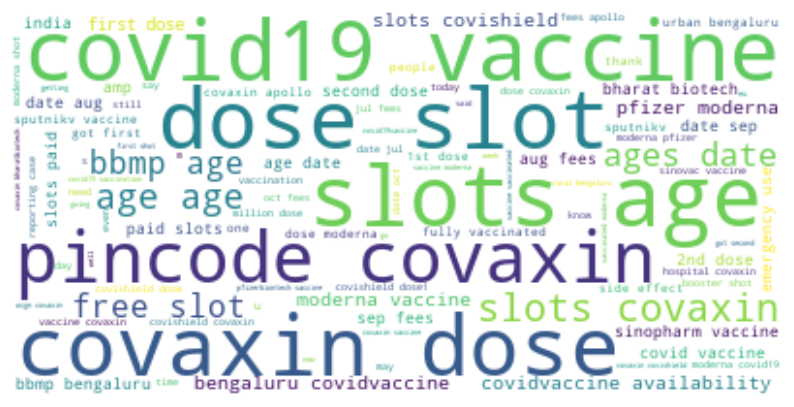

In [33]:
# World Cloud
tweet_All = " ".join(review for review in df["text"])

fig, ax = plt.subplots(1, 1, figsize  = (10,10))
# Create and generate a word cloud image:
wordcloud_ALL = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(tweet_All)

# Display the generated image:
ax.imshow(wordcloud_ALL, interpolation='bilinear')

ax.axis('off')

0.045025512640641766
0.10607405641573862
0.8488740502312555


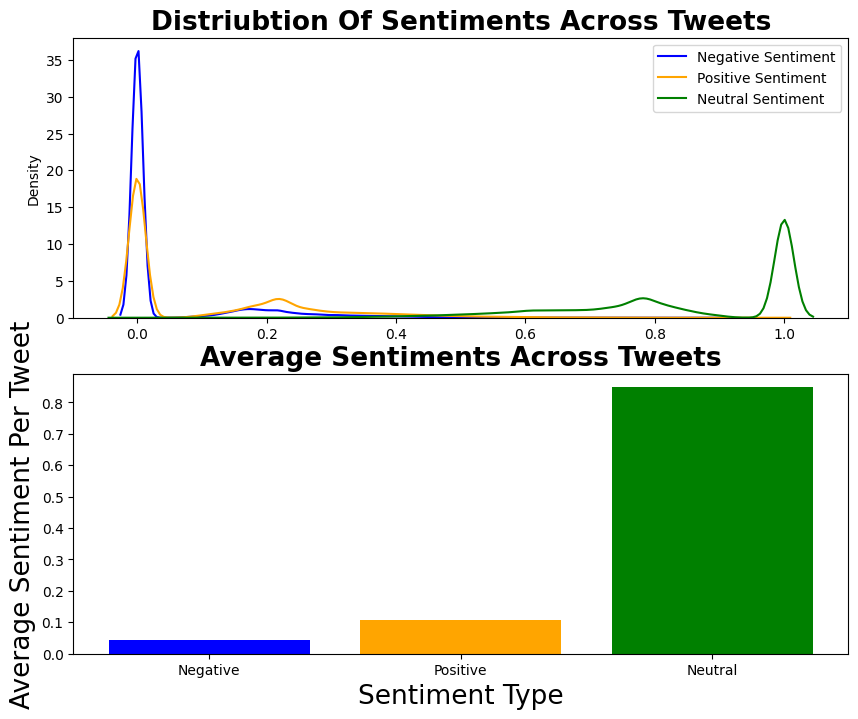

In [34]:
# Sentiment Distribution over dataset
plt.figure(figsize=(10, 8))
plt.subplot(2,1,1)
plt.title('Distriubtion Of Sentiments Across Tweets',fontsize=19,fontweight='bold')
sns.kdeplot(df['Negative Sentiment'], color = 'blue')
sns.kdeplot(df['Positive Sentiment'], color = 'orange')
sns.kdeplot(df['Neutral Sentiment'], color = 'green')
plt.xlabel(' ')
plt.legend(['Negative Sentiment','Positive Sentiment','Neutral Sentiment'])
plt.subplot(2,1,2)
plt.title('Average Sentiments Across Tweets',fontsize=19,fontweight='bold')
neg_total_avg = (df['Negative Sentiment'].sum())/len(df.index)
print(neg_total_avg)
pos_total_avg = (df['Positive Sentiment'].sum())/len(df.index)
print(pos_total_avg)
neu_total_avg = (df['Neutral Sentiment'].sum())/len(df.index)
print(neu_total_avg)
sentiment_type = ['Negative','Positive','Neutral']
sentiment_total_avg = [neg_total_avg, pos_total_avg, neu_total_avg]
plt.bar(sentiment_type, sentiment_total_avg, color = ['blue', 'orange', 'green'])
plt.ylabel('Average Sentiment Per Tweet',fontsize=19)
plt.xlabel('Sentiment Type',fontsize=19)
plt.show()

# Time Series Analysis


Этот код предназначен для создания графика, который визуализирует количество твитов в каждую дату. Он также добавляет горизонтальную линию, представляющую среднее значение столбца 'Negative Sentiment' (отрицательная окраска) и несколько аннотаций, которые помечают определенные даты и связанные с ними события.

Общий смысл этого кода состоит в том, чтобы помочь понять динамику количества твитов с течением времени и выделить определенные события или периоды, которые могут иметь влияние на количество твитов. Например, аннотации могут отмечать даты, связанные с важными событиями, такими как авторизация J&J (Johnson & Johnson) или обсуждение побочных эффектов кровоизлияний от J&J.

Такой график может быть полезным инструментом для анализа данных и визуализации связей между временными метками и количеством твитов, а также для выявления интересующих событий или трендов в данных о твитах.

In [35]:
# Change variables
import datetime

ft_data = df.copy()
ft_data['date'] = pd.to_datetime(df['date']).dt.date
ft_data['year'] = pd.DatetimeIndex(ft_data['date']).year
b_date_count = ft_data.groupby(by='date').count().reset_index()
b_date_count = b_date_count.rename(columns={'text': 'Tweets Per Day'})
fig = px.line(b_date_count, x='date', y='Tweets Per Day')

fig.add_shape(
    type="line",
    x0=b_date_count['date'].values[0], y0=b_date_count['Negative Sentiment'].mean(),
    x1=b_date_count['date'].values[-1], y1=b_date_count['Negative Sentiment'].mean(),
    line=dict(
        color="Red",
        width=2,
        dash="dashdot",
    ),
    name='Mean'
)

fig.update_traces(mode="markers+lines")
fig.update_layout(hovermode="x unified")

# Annotations
b_date_count.date = pd.to_datetime(b_date_count.date)
b_date_count_dt = b_date_count.set_index('date')

fig.add_annotation(
    x=datetime.datetime(2021, 3, 1), y=b_date_count_dt.loc[pd.Timestamp('2021-03-01'), 'Tweets Per Day'],
    text="J&J authorization",
    showarrow=True,
    arrowhead=3,
    bordercolor="#c7c7c7"
)

fig.add_annotation(
    x=datetime.datetime(2021, 4, 21), y=b_date_count_dt.loc[pd.Timestamp('2021-04-21'), 'Tweets Per Day'],
    text="Fear of supply outstripping demand & CDC discussion of J&J bloodclots",
    showarrow=True,
    arrowhead=3,
    yshift=5,
    bordercolor="#c7c7c7"
)

fig.add_annotation(
    x=datetime.datetime(2021, 6, 29), y=b_date_count_dt.loc[pd.Timestamp('2021-06-29'), 'Tweets Per Day'],
    text="Discussion of vaccine protection against delta variant",
    showarrow=True,
    arrowhead=3,
    yshift=5,
    ay=-30,
    bordercolor="#c7c7c7"
)

fig.update_layout(title='<b>Daily Tweets</b>', width=1000)
fig.show()


## Postive, Negative, & Neutral Analysis


In [36]:
# Assigning sentiment 
Positive_tweet = df[df['Positive Sentiment'] >= 0.5].reset_index()
Negative_tweet = df[df['Negative Sentiment']>= 0.5].reset_index()
Neutral_tweet = df[df['Neutral Sentiment']>= 0.5].reset_index()

In [37]:
# 50 most common positive words

all_positive_words=[]
for i in range(len(Positive_tweet['lemmatized'])):
    a=Positive_tweet['lemmatized'][i]
    for i in a:
        all_positive_words.append(i)
all_positive_words=pd.Series(np.array(all_positive_words))
common_words=all_positive_words.value_counts()[:50].rename_axis('Common Positive Words').reset_index(name='count')
fig = px.treemap(common_words, path=['Common Positive Words'], values='count',title='50 Most Common Words In Positive Tweets')
fig.show()

## Time Series Analysis

In [38]:
# 50 most common negative words

all_negative_words=[]
for i in range(len(Negative_tweet['lemmatized'])):
    a=Negative_tweet['lemmatized'][i]
    for i in a:
        all_negative_words.append(i)
all_negative_words=pd.Series(np.array(all_negative_words))
common_words=all_negative_words.value_counts()[:50].rename_axis('Common Negative Words').reset_index(name='count')
fig = px.treemap(common_words, path=['Common Negative Words'], values='count',title='50 Most Common Words In Negative Tweets')
fig.show()

In [39]:
# 50 most common neutral words

all_neutral_words=[]
for i in range(len(Neutral_tweet['lemmatized'])):
    a=Neutral_tweet['lemmatized'][i]
    for i in a:
        all_neutral_words.append(i)
all_neutral_words=pd.Series(np.array(all_neutral_words))
common_words=all_neutral_words.value_counts()[:50].rename_axis('Common Neutral Words').reset_index(name='count')
fig = px.treemap(common_words, path=['Common Neutral Words'], values='count',title='50 Most Common Words In Neutral Tweets')
fig.show()

В этой записной книжке анализируется настроение твитов, связанных с кампанией по вакцинации против COVID-19. Мы видим влияние широко распространенных слухов, которые привели к крайне негативным настроениям в начале кампании по вакцинации. Тем не менее, с конкретными доказательствами, свидетельствующими о надежности вакцин, кампания по вакцинации идет полным ходом по всему миру.

ПРИМЕЧАНИЕ. В наборе данных есть твиты с января 2020 г. по декабрь 2021 г., и настроения анализируются в течение этого периода. Временная шкала показывает переход от ранних негативных настроений к нейтральным, а затем к позитивным. В наборе данных в основном есть нейтральные комментарии, затем отрицательные и положительные комментарии. Лучшие нейтральные и положительные комментарии включали covaxin , Safe , Thank , Moderna. Лучшие комментарии positie включают Moderna , pfizer , force , lockdown

In [40]:

def remove_hashtags(text):
    # Удаление хэштегов
    cleaned_text = re.sub(r'#\w+', '', text)
    return cleaned_text

def remove_urls(text):
    # Удаление ссылок
    cleaned_text = re.sub(r'http\S+', '', text)
    return cleaned_text

def remove_userhandles(text):
    # Удаление упоминаний пользователей
    cleaned_text = re.sub(r'@\w+', '', text)
    return cleaned_text

def remove_multiple_spaces(text):
    # Удаление множественных пробелов
    cleaned_text = re.sub(r'\s+', ' ', text)
    return cleaned_text

def remove_special_characters(text):
    # Удаление специальных символов и знаков пунктуации
    cleaned_text = re.sub(r'[^\w\s]', '', text)
    return cleaned_text

# Применение функций очистки к столбцу 'text'
df_1['clean_data'] = df_1['text'].apply(remove_hashtags)
df_1['clean_data'] = df_1['clean_data'].apply(remove_urls)
df_1['clean_data'] = df_1['clean_data'].apply(remove_userhandles)
df_1['clean_data'] = df_1['clean_data'].apply(remove_multiple_spaces)
df_1['clean_data'] = df_1['clean_data'].apply(remove_special_characters)

In [41]:
df_1[['clean_data','text']].head()

,clean_data,text
0,Same folks said daikon paste could treat a cyt...,Same folks said daikon paste could treat a cyt...
1,While the world has been on the wrong side of ...,While the world has been on the wrong side of ...
2,Russian vaccine is created to last 24 years,#coronavirus #SputnikV #AstraZeneca #PfizerBio...
3,Facts are immutable Senator even when youre no...,"Facts are immutable, Senator, even when you're..."
4,Explain to me again why we need a vaccine,Explain to me again why we need a vaccine @Bor...


## Assigning Polarity & Subjectivity to tweets

In [42]:
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords

lemmatizer = WordNetLemmatizer()
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/alyona_dushkina/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/alyona_dushkina/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [43]:
#stopwords are the words which won't bring about any changes to the polarity of the tweet
stop_words = stopwords.words('english')   
len(stop_words),stop_words[5:10]

(179, ['our', 'ours', 'ourselves', 'you', "you're"])

In [44]:
# function to remove stopwords
def stopWords(tweet):
  clean_tweet = tweet
  clean_tweet = " ".join(word for word in clean_tweet.split() if word not in stop_words)
# clean_tweet = " ".join(lemmatizer.lemmatize(word) for word in clean_tweet.split())
  return clean_tweet

In [45]:
df_1['clean_data'] = df_1['clean_data'].apply(lambda x: stopWords(x))


In [46]:
df_1.head()


,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet,clean_data
0,1340539111971516416,Rachel Roh,"La Crescenta-Montrose, CA",Aggregator of Asian American news; scanning di...,2009-04-08 17:52:46,405,1692,3247,False,2020-12-20 06:06:44,Same folks said daikon paste could treat a cyt...,['PfizerBioNTech'],Twitter for Android,0,0,False,Same folks said daikon paste could treat cytok...
1,1338158543359250433,Albert Fong,"San Francisco, CA","Marketing dude, tech geek, heavy metal & '80s ...",2009-09-21 15:27:30,834,666,178,False,2020-12-13 16:27:13,While the world has been on the wrong side of ...,NaN,Twitter Web App,1,1,False,While world wrong side history year hopefully ...
2,1337858199140118533,eli🇱🇹🇪🇺👌,Your Bed,"heil, hydra 🖐☺",2020-06-25 23:30:28,10,88,155,False,2020-12-12 20:33:45,#coronavirus #SputnikV #AstraZeneca #PfizerBio...,"['coronavirus', 'SputnikV', 'AstraZeneca', 'Pf...",Twitter for Android,0,0,False,Russian vaccine created last 24 years
3,1337855739918835717,Charles Adler,"Vancouver, BC - Canada","Hosting ""CharlesAdlerTonight"" Global News Radi...",2008-09-10 11:28:53,49165,3933,21853,True,2020-12-12 20:23:59,"Facts are immutable, Senator, even when you're...",NaN,Twitter Web App,446,2129,False,Facts immutable Senator even youre ethically s...
4,1337854064604966912,Citizen News Channel,NaN,Citizen News Channel bringing you an alternati...,2020-04-23 17:58:42,152,580,1473,False,2020-12-12 20:17:19,Explain to me again why we need a vaccine @Bor...,"['whereareallthesickpeople', 'PfizerBioNTech']",Twitter for iPhone,0,0,False,Explain need vaccine


In [47]:
from textblob import TextBlob
# Function to assign polarity and subjectivity to the tweets
def blob_fun(text):
  senti = TextBlob(text)
  senti_polarity = senti.sentiment.polarity
  senti_subjectivity = senti.sentiment.subjectivity

  if senti_polarity > 0:
    res = 'Positive'

  elif senti_polarity < 0:
    res = 'Negative'

  elif senti_polarity == 0:
    res ="Neutral"

  result = {'polarity':senti_polarity,'subjectivity':senti_subjectivity,'sentiment':res}

  return result

In [48]:
blob_fun(df_1['clean_data'][5])


{'polarity': 0.4, 'subjectivity': 0.25, 'sentiment': 'Positive'}

In [49]:
df_1['results'] = df_1['clean_data'].apply(blob_fun)


In [50]:
df_1.drop(columns={"user_location",'text'},inplace=True)


In [51]:
df_1.head()


,id,user_name,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,hashtags,source,retweets,favorites,is_retweet,clean_data,results
0,1340539111971516416,Rachel Roh,Aggregator of Asian American news; scanning di...,2009-04-08 17:52:46,405,1692,3247,False,2020-12-20 06:06:44,['PfizerBioNTech'],Twitter for Android,0,0,False,Same folks said daikon paste could treat cytok...,"{'polarity': 0.0, 'subjectivity': 0.125, 'sent..."
1,1338158543359250433,Albert Fong,"Marketing dude, tech geek, heavy metal & '80s ...",2009-09-21 15:27:30,834,666,178,False,2020-12-13 16:27:13,NaN,Twitter Web App,1,1,False,While world wrong side history year hopefully ...,"{'polarity': -0.5, 'subjectivity': 0.9, 'senti..."
2,1337858199140118533,eli🇱🇹🇪🇺👌,"heil, hydra 🖐☺",2020-06-25 23:30:28,10,88,155,False,2020-12-12 20:33:45,"['coronavirus', 'SputnikV', 'AstraZeneca', 'Pf...",Twitter for Android,0,0,False,Russian vaccine created last 24 years,"{'polarity': 0.0, 'subjectivity': 0.0333333333..."
3,1337855739918835717,Charles Adler,"Hosting ""CharlesAdlerTonight"" Global News Radi...",2008-09-10 11:28:53,49165,3933,21853,True,2020-12-12 20:23:59,NaN,Twitter Web App,446,2129,False,Facts immutable Senator even youre ethically s...,"{'polarity': 0.1, 'subjectivity': 0.55, 'senti..."
4,1337854064604966912,Citizen News Channel,Citizen News Channel bringing you an alternati...,2020-04-23 17:58:42,152,580,1473,False,2020-12-12 20:17:19,"['whereareallthesickpeople', 'PfizerBioNTech']",Twitter for iPhone,0,0,False,Explain need vaccine,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim..."


In [52]:
df_1 = df_1.join(pd.json_normalize(data=df_1['results']))


In [53]:
df_1.head()

,id,user_name,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,hashtags,source,retweets,favorites,is_retweet,clean_data,results,polarity,subjectivity,sentiment
0,1340539111971516416,Rachel Roh,Aggregator of Asian American news; scanning di...,2009-04-08 17:52:46,405,1692,3247,False,2020-12-20 06:06:44,['PfizerBioNTech'],Twitter for Android,0,0,False,Same folks said daikon paste could treat cytok...,"{'polarity': 0.0, 'subjectivity': 0.125, 'sent...",0.0,0.125000,Neutral
1,1338158543359250433,Albert Fong,"Marketing dude, tech geek, heavy metal & '80s ...",2009-09-21 15:27:30,834,666,178,False,2020-12-13 16:27:13,NaN,Twitter Web App,1,1,False,While world wrong side history year hopefully ...,"{'polarity': -0.5, 'subjectivity': 0.9, 'senti...",-0.5,0.900000,Negative
2,1337858199140118533,eli🇱🇹🇪🇺👌,"heil, hydra 🖐☺",2020-06-25 23:30:28,10,88,155,False,2020-12-12 20:33:45,"['coronavirus', 'SputnikV', 'AstraZeneca', 'Pf...",Twitter for Android,0,0,False,Russian vaccine created last 24 years,"{'polarity': 0.0, 'subjectivity': 0.0333333333...",0.0,0.033333,Neutral
3,1337855739918835717,Charles Adler,"Hosting ""CharlesAdlerTonight"" Global News Radi...",2008-09-10 11:28:53,49165,3933,21853,True,2020-12-12 20:23:59,NaN,Twitter Web App,446,2129,False,Facts immutable Senator even youre ethically s...,"{'polarity': 0.1, 'subjectivity': 0.55, 'senti...",0.1,0.550000,Positive
4,1337854064604966912,Citizen News Channel,Citizen News Channel bringing you an alternati...,2020-04-23 17:58:42,152,580,1473,False,2020-12-12 20:17:19,"['whereareallthesickpeople', 'PfizerBioNTech']",Twitter for iPhone,0,0,False,Explain need vaccine,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.0,0.000000,Neutral


In [54]:
# categorized tweets in seperate Series
positive_tweet =  df_1[df_1['sentiment'] == 'Positive']['clean_data']
negative_tweet =  df_1[df_1['sentiment'] == 'Negative']['clean_data']
neutral_tweet =  df_1[df_1['sentiment'] == 'Neutral']['clean_data']

In [55]:

# creating WordClouds
def cloud_of_Words(tweet_cat,title):
    forcloud = ' '.join([tweet for tweet in tweet_cat])
    wordcloud = WordCloud(width =500,height = 300,random_state =5,max_font_size=110, colormap='Pastel1').generate(forcloud)
    plt.imshow(wordcloud, interpolation ='bilinear')
    plt.title(title)
    plt.axis('off')
    plt.show()
    plt.figure(figsize = (10,8))

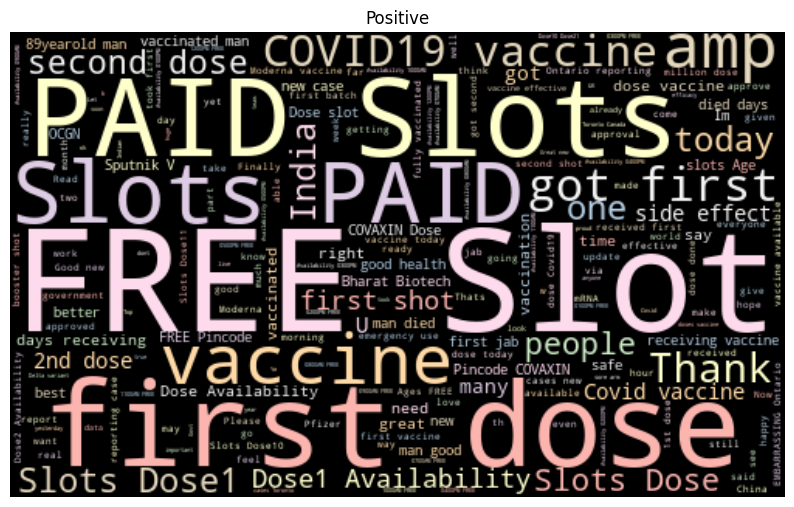

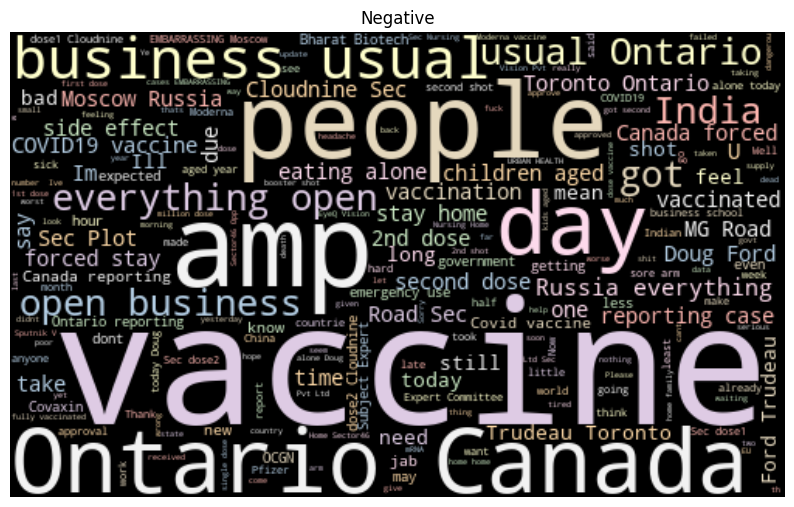

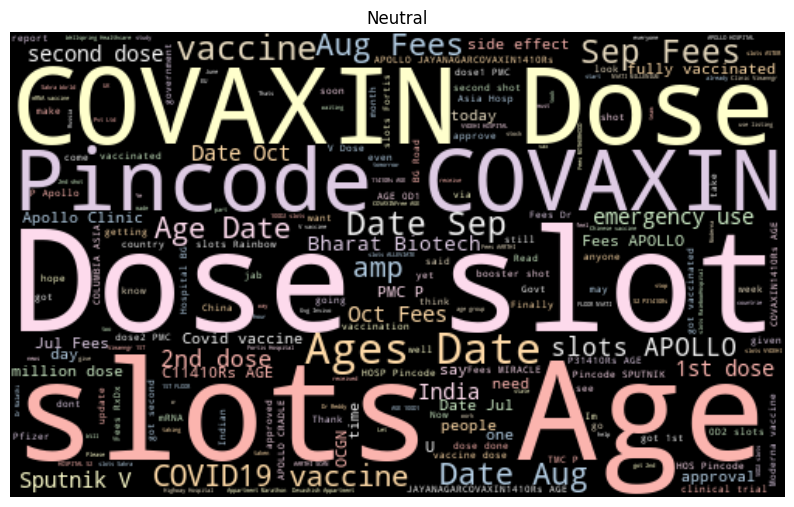

<Figure size 1000x800 with 0 Axes>

In [56]:
plt.figure(figsize = (10,8))
# Creating wordclouds for positive, negative, neutral tweets
cloud_of_Words(positive_tweet, 'Positive')
cloud_of_Words(negative_tweet, 'Negative')
cloud_of_Words(neutral_tweet, 'Neutral')

The above three wordclouds have the similar words as expected because our main analysis is Covid Vaccine

In [57]:
# Breaking down the tweets into words in seperate categories
positive_tokens = [token for line in positive_tweet for token in line.split()]
negative_tokens = [token for line in negative_tweet for token in line.split()]
neutral_tokens = [token for line in neutral_tweet for token in line.split()]

In [58]:
import nltk

# Breaking down the tweets into words in separate categories
positive_tokens = nltk.word_tokenize(' '.join(positive_tweet))
negative_tokens = nltk.word_tokenize(' '.join(negative_tweet))
neutral_tokens = nltk.word_tokenize(' '.join(neutral_tweet))


In [59]:
from collections import Counter
# to get most used words
def get_maxtoken(tweets,num=30):
  word_tokens = Counter(tweets)
  max_common = word_tokens.most_common(num)
  return dict(max_common)

In [60]:
def token_df_vis(x, title):
  df = pd.DataFrame(get_maxtoken(x).items(), columns=['words', 'count'])
  fig = px.bar(df, x='words', y='count', title=title, color='words')  # Изменение цвета по столбцу 'words'
  fig.show()

In [61]:
df_1.head()

,id,user_name,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,hashtags,source,retweets,favorites,is_retweet,clean_data,results,polarity,subjectivity,sentiment
0,1340539111971516416,Rachel Roh,Aggregator of Asian American news; scanning di...,2009-04-08 17:52:46,405,1692,3247,False,2020-12-20 06:06:44,['PfizerBioNTech'],Twitter for Android,0,0,False,Same folks said daikon paste could treat cytok...,"{'polarity': 0.0, 'subjectivity': 0.125, 'sent...",0.0,0.125000,Neutral
1,1338158543359250433,Albert Fong,"Marketing dude, tech geek, heavy metal & '80s ...",2009-09-21 15:27:30,834,666,178,False,2020-12-13 16:27:13,NaN,Twitter Web App,1,1,False,While world wrong side history year hopefully ...,"{'polarity': -0.5, 'subjectivity': 0.9, 'senti...",-0.5,0.900000,Negative
2,1337858199140118533,eli🇱🇹🇪🇺👌,"heil, hydra 🖐☺",2020-06-25 23:30:28,10,88,155,False,2020-12-12 20:33:45,"['coronavirus', 'SputnikV', 'AstraZeneca', 'Pf...",Twitter for Android,0,0,False,Russian vaccine created last 24 years,"{'polarity': 0.0, 'subjectivity': 0.0333333333...",0.0,0.033333,Neutral
3,1337855739918835717,Charles Adler,"Hosting ""CharlesAdlerTonight"" Global News Radi...",2008-09-10 11:28:53,49165,3933,21853,True,2020-12-12 20:23:59,NaN,Twitter Web App,446,2129,False,Facts immutable Senator even youre ethically s...,"{'polarity': 0.1, 'subjectivity': 0.55, 'senti...",0.1,0.550000,Positive
4,1337854064604966912,Citizen News Channel,Citizen News Channel bringing you an alternati...,2020-04-23 17:58:42,152,580,1473,False,2020-12-12 20:17:19,"['whereareallthesickpeople', 'PfizerBioNTech']",Twitter for iPhone,0,0,False,Explain need vaccine,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.0,0.000000,Neutral


In [62]:
token_df_vis(positive_tokens,'Positive')
token_df_vis(negative_tokens,'Negative')
token_df_vis(neutral_tokens,'Neutral')

In [ ]:
# Создание графика рассеяния с помощью Plotly Express
fig = px.scatter(df_1, x='polarity', y='subjectivity', color='sentiment', title='Sentiment Analysis')
fig.update_traces(marker=dict(size=10, line=dict(width=1, color='Black')))  # Изменение размера и цвета маркеров

fig.update_layout(
    xaxis=dict(title='Polarity'),  # Настройка подписи оси X
    yaxis=dict(title='Subjectivity'),  # Настройка подписи оси Y
    legend=dict(title='Sentiment'),  # Настройка подписи легенды
    showlegend=True  # Отображение легенды
)

fig.show()

In [64]:
def percent(x,y):
  return print("Percentage of "+y+" tweets :",round(len(x)/df_1.shape[0]*100,3),"%")

In [65]:
percent(positive_tweet, 'positive')
percent(negative_tweet, 'negative')
percent(neutral_tweet, 'neutral')

Percentage of positive tweets : 33.545 %
Percentage of negative tweets : 9.887 %
Percentage of neutral tweets : 56.569 %


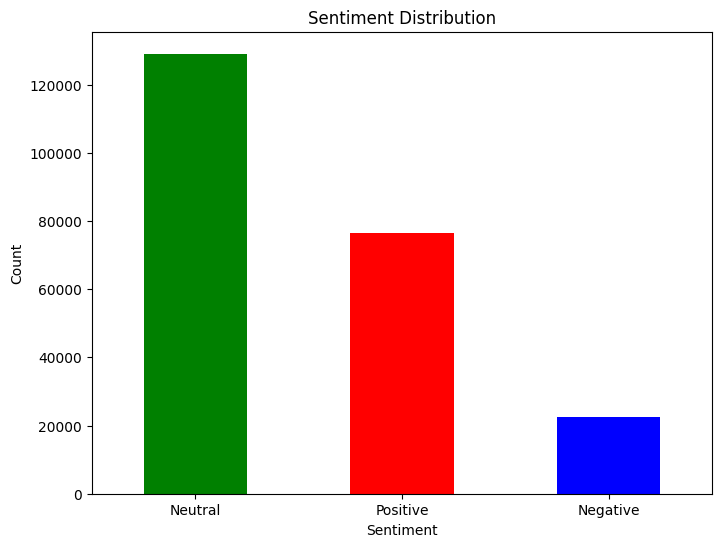

In [66]:
# Создание графика столбчатой диаграммы с использованием Matplotlib
sentiment_counts = df_1['sentiment'].value_counts()
plt.figure(figsize=(8, 6))
sentiment_counts.plot(kind='bar', color=['green', 'red', 'blue'])  # Установка цветов столбцов

# Настройка внешнего вида графика
plt.title('Sentiment Distribution')
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.xticks(rotation=0)

plt.show()

## Vaccine-wise analysis

In [67]:
df_1.columns


Index(['id', 'user_name', 'user_description', 'user_created', 'user_followers',
       'user_friends', 'user_favourites', 'user_verified', 'date', 'hashtags',
       'source', 'retweets', 'favorites', 'is_retweet', 'clean_data',
       'results', 'polarity', 'subjectivity', 'sentiment'],
      dtype='object')

In [68]:
data = df_1.drop(columns="results")
data.head()

,id,user_name,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,hashtags,source,retweets,favorites,is_retweet,clean_data,polarity,subjectivity,sentiment
0,1340539111971516416,Rachel Roh,Aggregator of Asian American news; scanning di...,2009-04-08 17:52:46,405,1692,3247,False,2020-12-20 06:06:44,['PfizerBioNTech'],Twitter for Android,0,0,False,Same folks said daikon paste could treat cytok...,0.0,0.125000,Neutral
1,1338158543359250433,Albert Fong,"Marketing dude, tech geek, heavy metal & '80s ...",2009-09-21 15:27:30,834,666,178,False,2020-12-13 16:27:13,NaN,Twitter Web App,1,1,False,While world wrong side history year hopefully ...,-0.5,0.900000,Negative
2,1337858199140118533,eli🇱🇹🇪🇺👌,"heil, hydra 🖐☺",2020-06-25 23:30:28,10,88,155,False,2020-12-12 20:33:45,"['coronavirus', 'SputnikV', 'AstraZeneca', 'Pf...",Twitter for Android,0,0,False,Russian vaccine created last 24 years,0.0,0.033333,Neutral
3,1337855739918835717,Charles Adler,"Hosting ""CharlesAdlerTonight"" Global News Radi...",2008-09-10 11:28:53,49165,3933,21853,True,2020-12-12 20:23:59,NaN,Twitter Web App,446,2129,False,Facts immutable Senator even youre ethically s...,0.1,0.550000,Positive
4,1337854064604966912,Citizen News Channel,Citizen News Channel bringing you an alternati...,2020-04-23 17:58:42,152,580,1473,False,2020-12-12 20:17:19,"['whereareallthesickpeople', 'PfizerBioNTech']",Twitter for iPhone,0,0,False,Explain need vaccine,0.0,0.000000,Neutral


In [69]:
# creating reference tags for 5 vaccines -> Pfizer, Covaxin(Bharat Biotech), Sputnik,AstraZenca(Covishield),Moderna
pfizer_refs = ["Pfizer","pfizer","Pfizer–BioNTech","pfizer-bioNtech","BioNTech","biontech"]
bbiotech_refs = ["covax","covaxin","Covax","Covaxin","Bharat Biotech","bharat biotech","BharatBiotech","bharatbiotech"]
sputnik_refs = ["russia","sputnik","Sputnik","V"]
astra_refs = ['sii','SII','adar poonawalla','Covishield','covishield','astra','zenca','Oxford–AstraZeneca','astrazenca','oxford-astrazenca','serum institiute']
moderna_refs = ['moderna','Moderna','mRNA-1273','Spikevax']


In [70]:
def refer(tweet, refs):
  flag =0
  for ref in refs:
    if tweet.find(ref) != -1:
      flag =1
  return flag

data['pfizer'] = data['clean_data'].apply(lambda x : refer(x, pfizer_refs))
data['bbiotech'] = data['clean_data'].apply(lambda x : refer(x, bbiotech_refs))
data['sputnik'] = data['clean_data'].apply(lambda x : refer(x, sputnik_refs))
data['astra'] = data['clean_data'].apply(lambda x : refer(x, astra_refs))
data['moderna'] = data['clean_data'].apply(lambda x : refer(x, moderna_refs))

In [71]:
display(data.pfizer.value_counts(),data.bbiotech.value_counts(),data.sputnik.value_counts(),data.astra.value_counts(),data.moderna.value_counts())

pfizer
0    224503
1      3704
Name: count, dtype: int64

bbiotech
0    220667
1      7540
Name: count, dtype: int64

sputnik
0    181528
1     46679
Name: count, dtype: int64

astra
0    227130
1      1077
Name: count, dtype: int64

moderna
0    221430
1      6777
Name: count, dtype: int64

In [72]:
data[data['bbiotech']==1].head()    #what the dataset looks like


,id,user_name,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,hashtags,...,is_retweet,clean_data,polarity,subjectivity,sentiment,pfizer,bbiotech,sputnik,astra,moderna
1592,1342817439348740097,ECOMNEWSMED,"L'actualité #économique, #politique et des #en...",2015-09-05 23:01:10,62053,5044,3950,False,2020-12-26 13:00:00,['Irak'],...,False,The country part Gavi Vaccine Alliance oversee...,0.0,0.0,Neutral,0,1,1,0,0
2202,1345704155852099584,John Nuleti,"Tokyo based consultant, coach and investor. Tw...",2020-06-07 08:43:13,3,44,5,False,2021-01-03 12:10:47,NaN,...,False,India approves AstraZeneca Bharat Biotech vacc...,0.0,0.0,Neutral,1,1,0,0,0
2383,1346310674515783680,Healthwire,Healthwire is a leading digital platform bring...,2019-03-10 04:59:04,4971,397,215,False,2021-01-05 04:20:52,"['Covishield', 'Pfizer', 'COVID19']",...,False,Covid19 Vaccine War Covaxin Maker Bharat Biote...,0.5,0.5,Positive,0,1,1,0,0
4138,1352085240324386818,Tanmoy Ray,Career & MS Admissions Consultant @teamstoodnt...,2012-03-09 17:57:10,1214,1754,15319,False,2021-01-21 02:46:56,NaN,...,False,Covishield vs Covaxin vs ModernaPfizer Science...,-0.4,0.7,Negative,1,1,1,1,1
5399,1358299422233219073,#JaiShriRam🇮🇳ArtiSharma_VHS.,"Mother, Wife; Teacher ( MA, MEd )🕉️ #IndiaNeed...",2017-12-27 02:38:58,2764,5001,139490,False,2021-02-07 06:19:52,['Covaxin'],...,False,Dr Bharat Biotech Signs US Partner IndiaApprov...,0.0,0.0,Neutral,0,1,1,0,0


In [73]:
data[data['pfizer']==1].head()


,id,user_name,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,hashtags,...,is_retweet,clean_data,polarity,subjectivity,sentiment,pfizer,bbiotech,sputnik,astra,moderna
23,1337773751841144833,BOOM Live,IFCN certified fact-driven journalism. India's...,2014-03-16 03:52:50,64185,1183,1794,True,2020-12-12 14:58:11,NaN,...,False,The US Food Drug Administration FDA granted em...,0.00,0.000000,Neutral,1,0,0,0,0
42,1337732077278662657,mystic,I believe in the goodness of humanity.,2020-05-20 10:57:00,14,162,1341,False,2020-12-12 12:12:35,"['CovidVaccine', 'Pfizer', 'PfizerBioNTech', '...",...,False,BioNTech COVID19,0.00,0.000000,Neutral,1,0,1,0,0
66,1338592427041579008,H24,Go for breaking news and find what’s happening...,2020-06-19 23:58:38,403,22,3001,False,2020-12-14 21:11:19,NaN,...,False,ICU nurse Sandra Lindsay said proud becoming o...,0.50,0.727778,Positive,1,0,0,0,0
88,1338560750571446273,KFDM News,Providing news our viewers have been counting ...,2009-02-09 17:40:37,20014,1127,2550,True,2020-12-14 19:05:26,NaN,...,False,KFDMsFOX 4s Baptist hospital getting first han...,0.25,0.333333,Positive,1,0,1,0,0
94,1338551175587786752,India Blooms,A news and reference portal on India and a 24X...,2009-10-10 11:19:34,16816,2448,20,False,2020-12-14 18:27:23,['Ontario'],...,False,Toronto receive Ontarios 1st doses Pfizer COVI...,0.00,0.000000,Neutral,1,0,1,0,0


In [74]:
def stats(a,b,c,d,e):
  for i in a,b,c,d,e:
     display(data[data[i]==1][[i,'polarity','subjectivity']].groupby(i).agg([np.mean,np.max,np.min,np.median]))

In [75]:
stats('pfizer','bbiotech','sputnik','astra','moderna')


polarity                  subjectivity                 
            mean amax amin median         mean amax amin median
pfizer                                                         
1       0.098498  1.0 -1.0    0.0     0.280823  1.0  0.0    0.2

polarity                  subjectivity                 
              mean amax amin median         mean amax amin median
bbiotech                                                         
1         0.085948  1.0 -1.0    0.0     0.228748  1.0  0.0    0.0

polarity                  subjectivity                 
             mean amax amin median         mean amax amin median
sputnik                                                         
1        0.064909  1.0 -1.0    0.0     0.168676  1.0  0.0    0.0

polarity                  subjectivity                 
           mean amax amin median         mean amax amin median
astra                                                         
1      0.097748  1.0 -0.8    0.0     0.215363  1.0  0.0    0.0

polarity                  subjectivity                    
             mean amax amin median         mean amax amin    median
moderna                                                            
1        0.088468  1.0 -1.0    0.0     0.247506  1.0  0.0  0.144444

In [76]:
pfizer = data[data['pfizer']==1][['date','polarity']]
bbiotech = data[data['bbiotech']==1][['date','polarity']]
sputnik = data[data['sputnik']==1][['date','polarity']]
astra = data[data['astra']==1][['date','polarity']]
moderna = data[data['moderna']==1][['date','polarity']]

pfizer = pfizer.sort_values(by='date',ascending=True)
bbiotech = bbiotech.sort_values(by='date',ascending=True)
sputnik = sputnik.sort_values(by='date',ascending=True)
astra = astra.sort_values(by='date',ascending=True)
moderna = moderna.sort_values(by='date',ascending=True)

pfizer['Avg Polarity'] = pfizer.polarity.rolling(20, min_periods=3).mean()
bbiotech['Avg Polarity'] = bbiotech.polarity.rolling(20, min_periods=3).mean()
sputnik['Avg Polarity'] = sputnik.polarity.rolling(20, min_periods=3).mean()
astra['Avg Polarity'] = astra.polarity.rolling(5, min_periods=3).mean()
moderna['Avg Polarity'] = moderna.polarity.rolling(20, min_periods=3).mean()

In [77]:
bbiotech.head(10)


,date,polarity,Avg Polarity
1592,2020-12-26 13:00:00,0.000000,NaN
2202,2021-01-03 12:10:47,0.000000,NaN
2383,2021-01-05 04:20:52,0.500000,0.166667
4138,2021-01-21 02:46:56,-0.400000,0.025000
5401,2021-02-07 04:24:30,0.050000,0.030000
5399,2021-02-07 06:19:52,0.000000,0.025000
5630,2021-02-07 15:38:44,0.287500,0.062500
5629,2021-02-07 15:50:57,0.318182,0.094460
5840,2021-02-08 13:19:11,0.000000,0.083965
6068,2021-02-08 23:01:26,0.025000,0.078068


## Visualizing the vaccine Polarity (Moving Average) vs Time

In [78]:
a,b,c,d,e = pfizer,bbiotech,sputnik,astra,moderna
fig = px.line(a, x="date", y="Avg Polarity", title='Pfizer')
fig.show()
fig = px.line(b, x="date", y="Avg Polarity", title='Bharat Biotech')
fig.show()
fig = px.line(c, x="date", y="Avg Polarity", title='Sputnik')
fig.show()
fig = px.line(d, x="date", y="Avg Polarity", title='AstraZence/Covishield')
fig.show()
fig = px.line(e, x="date", y="Avg Polarity", title='Moderna')
fig.show()


### Visualizing Overall Vaccine Polarity

total=pd.DataFrame()
total['date'] = sorted(data['date'].unique())
senti=list()
for date in total['date']:
    senti.append(data[data['date']==date].polarity.mean())
total['Sentiment']=senti
fig = px.line(total, x="date", y="Sentiment", title='Overall Sentiment around Vaccines')
fig.show()   

In [79]:
data.head()

,id,user_name,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,hashtags,...,is_retweet,clean_data,polarity,subjectivity,sentiment,pfizer,bbiotech,sputnik,astra,moderna
0,1340539111971516416,Rachel Roh,Aggregator of Asian American news; scanning di...,2009-04-08 17:52:46,405,1692,3247,False,2020-12-20 06:06:44,['PfizerBioNTech'],...,False,Same folks said daikon paste could treat cytok...,0.0,0.125000,Neutral,0,0,0,0,0
1,1338158543359250433,Albert Fong,"Marketing dude, tech geek, heavy metal & '80s ...",2009-09-21 15:27:30,834,666,178,False,2020-12-13 16:27:13,NaN,...,False,While world wrong side history year hopefully ...,-0.5,0.900000,Negative,0,0,0,0,0
2,1337858199140118533,eli🇱🇹🇪🇺👌,"heil, hydra 🖐☺",2020-06-25 23:30:28,10,88,155,False,2020-12-12 20:33:45,"['coronavirus', 'SputnikV', 'AstraZeneca', 'Pf...",...,False,Russian vaccine created last 24 years,0.0,0.033333,Neutral,0,0,0,0,0
3,1337855739918835717,Charles Adler,"Hosting ""CharlesAdlerTonight"" Global News Radi...",2008-09-10 11:28:53,49165,3933,21853,True,2020-12-12 20:23:59,NaN,...,False,Facts immutable Senator even youre ethically s...,0.1,0.550000,Positive,0,0,0,0,0
4,1337854064604966912,Citizen News Channel,Citizen News Channel bringing you an alternati...,2020-04-23 17:58:42,152,580,1473,False,2020-12-12 20:17:19,"['whereareallthesickpeople', 'PfizerBioNTech']",...,False,Explain need vaccine,0.0,0.000000,Neutral,0,0,0,0,0


In [80]:
df_1.head()

,id,user_name,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,hashtags,source,retweets,favorites,is_retweet,clean_data,results,polarity,subjectivity,sentiment
0,1340539111971516416,Rachel Roh,Aggregator of Asian American news; scanning di...,2009-04-08 17:52:46,405,1692,3247,False,2020-12-20 06:06:44,['PfizerBioNTech'],Twitter for Android,0,0,False,Same folks said daikon paste could treat cytok...,"{'polarity': 0.0, 'subjectivity': 0.125, 'sent...",0.0,0.125000,Neutral
1,1338158543359250433,Albert Fong,"Marketing dude, tech geek, heavy metal & '80s ...",2009-09-21 15:27:30,834,666,178,False,2020-12-13 16:27:13,NaN,Twitter Web App,1,1,False,While world wrong side history year hopefully ...,"{'polarity': -0.5, 'subjectivity': 0.9, 'senti...",-0.5,0.900000,Negative
2,1337858199140118533,eli🇱🇹🇪🇺👌,"heil, hydra 🖐☺",2020-06-25 23:30:28,10,88,155,False,2020-12-12 20:33:45,"['coronavirus', 'SputnikV', 'AstraZeneca', 'Pf...",Twitter for Android,0,0,False,Russian vaccine created last 24 years,"{'polarity': 0.0, 'subjectivity': 0.0333333333...",0.0,0.033333,Neutral
3,1337855739918835717,Charles Adler,"Hosting ""CharlesAdlerTonight"" Global News Radi...",2008-09-10 11:28:53,49165,3933,21853,True,2020-12-12 20:23:59,NaN,Twitter Web App,446,2129,False,Facts immutable Senator even youre ethically s...,"{'polarity': 0.1, 'subjectivity': 0.55, 'senti...",0.1,0.550000,Positive
4,1337854064604966912,Citizen News Channel,Citizen News Channel bringing you an alternati...,2020-04-23 17:58:42,152,580,1473,False,2020-12-12 20:17:19,"['whereareallthesickpeople', 'PfizerBioNTech']",Twitter for iPhone,0,0,False,Explain need vaccine,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.0,0.000000,Neutral


In [81]:
df_1.head()

,id,user_name,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,hashtags,source,retweets,favorites,is_retweet,clean_data,results,polarity,subjectivity,sentiment
0,1340539111971516416,Rachel Roh,Aggregator of Asian American news; scanning di...,2009-04-08 17:52:46,405,1692,3247,False,2020-12-20 06:06:44,['PfizerBioNTech'],Twitter for Android,0,0,False,Same folks said daikon paste could treat cytok...,"{'polarity': 0.0, 'subjectivity': 0.125, 'sent...",0.0,0.125000,Neutral
1,1338158543359250433,Albert Fong,"Marketing dude, tech geek, heavy metal & '80s ...",2009-09-21 15:27:30,834,666,178,False,2020-12-13 16:27:13,NaN,Twitter Web App,1,1,False,While world wrong side history year hopefully ...,"{'polarity': -0.5, 'subjectivity': 0.9, 'senti...",-0.5,0.900000,Negative
2,1337858199140118533,eli🇱🇹🇪🇺👌,"heil, hydra 🖐☺",2020-06-25 23:30:28,10,88,155,False,2020-12-12 20:33:45,"['coronavirus', 'SputnikV', 'AstraZeneca', 'Pf...",Twitter for Android,0,0,False,Russian vaccine created last 24 years,"{'polarity': 0.0, 'subjectivity': 0.0333333333...",0.0,0.033333,Neutral
3,1337855739918835717,Charles Adler,"Hosting ""CharlesAdlerTonight"" Global News Radi...",2008-09-10 11:28:53,49165,3933,21853,True,2020-12-12 20:23:59,NaN,Twitter Web App,446,2129,False,Facts immutable Senator even youre ethically s...,"{'polarity': 0.1, 'subjectivity': 0.55, 'senti...",0.1,0.550000,Positive
4,1337854064604966912,Citizen News Channel,Citizen News Channel bringing you an alternati...,2020-04-23 17:58:42,152,580,1473,False,2020-12-12 20:17:19,"['whereareallthesickpeople', 'PfizerBioNTech']",Twitter for iPhone,0,0,False,Explain need vaccine,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.0,0.000000,Neutral


In [83]:

sentiment_mapping = {'Neutral': 0, 'Negative': -1, 'Positive': 1}
df_1['sentiment'] = df_1['sentiment'].map(sentiment_mapping)


# Создание временного ряда настроений (например, посчитав количество положительных и отрицательных твитов по дням)
sentiment_series = df_1['sentiment'].resample('D').sum()

# Применение ARIMA для прогнозирования
model = ARIMA(sentiment, order=(1, 0, 0))
# Настройка параметров оптимизации
model_fit = model.fit()

# Прогноз на 1 неделю вперед
forecast_week = model_fit.forecast(steps=7)[0]

# Прогноз на 1 месяц вперед
forecast_month = model_fit.forecast(steps=30)[0]

# Прогноз на 3 месяца вперед
forecast_3months = model_fit.forecast(steps=90)[0]

# Визуализация прогноза
plt.plot(sentiment_series, label='Actual')
plt.plot(sentiment_series.index[-1] + pd.DateOffset(days=1), forecast_week, label='1 Week Forecast')
plt.plot(sentiment_series.index[-1] + pd.DateOffset(days=1), forecast_month, label='1 Month Forecast')
plt.plot(sentiment_series.index[-1] + pd.DateOffset(days=1), forecast_3months, label='3 Months Forecast')
plt.legend()
plt.xlabel('Date')
plt.ylabel('Sentiment')
plt.title('Sentiment Forecast')
plt.show()

TypeError: Only valid with DatetimeIndex, TimedeltaIndex or PeriodIndex, but got an instance of 'RangeIndex'

In [ ]:

# Change variables
ft_data = df_1.copy()
ft_data['date'] = pd.to_datetime(data['date']).dt.date
ft_data['year'] = pd.DatetimeIndex(ft_data['date']).year
b_date_count = ft_data.groupby(by='date').count().reset_index()
b_date_count = b_date_count.rename(columns={'id':'Tweets Per Day'})
fig = px.line(b_date_count,x='date',y='Tweets Per Day')

fig.add_shape(type="line",
    x0=b_date_count['date'].values[0], y0=b_date_count['Negative Sentiment'].mean(), x1=b_date_count['date'].values[-1], y1=b_date_count['Negative Sentiment'].mean(),
    line=dict(
        color="Red",
        width=2,
        dash="dashdot",
    ),
        name='Mean',
)

fig.update_traces(mode="markers+lines")
fig.update_layout(hovermode="x unified")


# ###annots
b_date_count.date = pd.to_datetime(b_date_count.date)
b_date_count_dt = b_date_count.set_index('date')

fig.add_annotation(x=datetime.datetime(2021,3,1), y=b_date_count_dt.loc[pd.Timestamp('2021-03-1'),'year'],
            text=r"J&J authorization",
            showarrow=True,
            arrowhead= 3,
            bordercolor="#c7c7c7")

fig.add_annotation(x=datetime.datetime(2021,4,21), y=b_date_count_dt.loc[pd.Timestamp('2021-04-21'),'year'],
            text=r"Fear of supply outstripping demand & CDC discussion of J&J bloodclots",
            showarrow=True,
            arrowhead=3,
            yshift=5,bordercolor="#c7c7c7")

fig.add_annotation(x=datetime.datetime(2021,6,29), y=b_date_count_dt.loc[pd.Timestamp('2021-06-29'),'year'],
            text=r"Discussion of vaccine protection against delta variant",
            showarrow=True,
            arrowhead=3,
            yshift=5,ay=-30,bordercolor="#c7c7c7")

fig.update_layout(title='<b>Daily Tweets<b>',width=1000)
fig.show()